Iterating over each pixel and if the value is not yet assigned then assign the value from candidates that is closest to picture's neighbours values

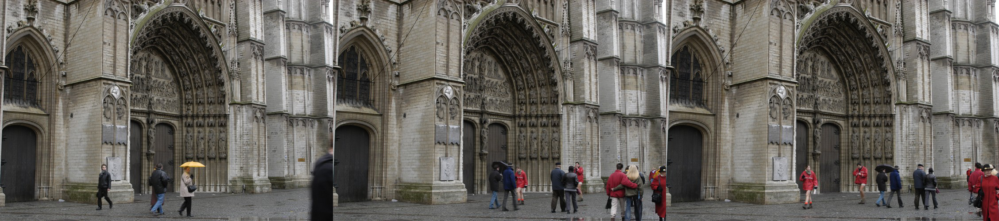

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from numpy.lib.stride_tricks import as_strided

import PIL
%matplotlib inline
from pandas import DataFrame
import pandas as pd
from IPython.display import display, HTML
from skimage.exposure import rescale_intensity
import plotly.graph_objects as go
import pandas as pd
import json

import image_processing_utils as ipu

pd.options.display.html.border = 0
pd.options.display.float_format = '{:,.2f}'.format

def imshow(image: np.ndarray):
    im_out = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return PIL.Image.fromarray(im_out)

files = 'd001.jpg d002.jpg d003.jpg d004.jpg d005.jpg result.png'.split(' ')
files_paths = [os.path.join('..','data','cathedral', x) for x in files]

images = [cv2.imread(x, 1) for x in files_paths]
images, target = images[:-1], images[-1]

imshow(np.concatenate(images[:3],1) )

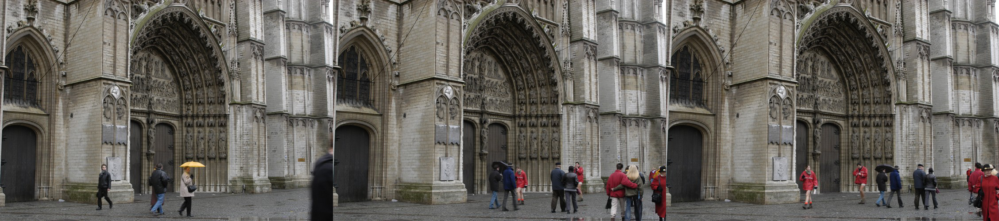

In [2]:
imshow(np.concatenate(images[:3],1) )

The idea:
Take the original images, 

Step 1: get the image of pixels that are the same (or similar)

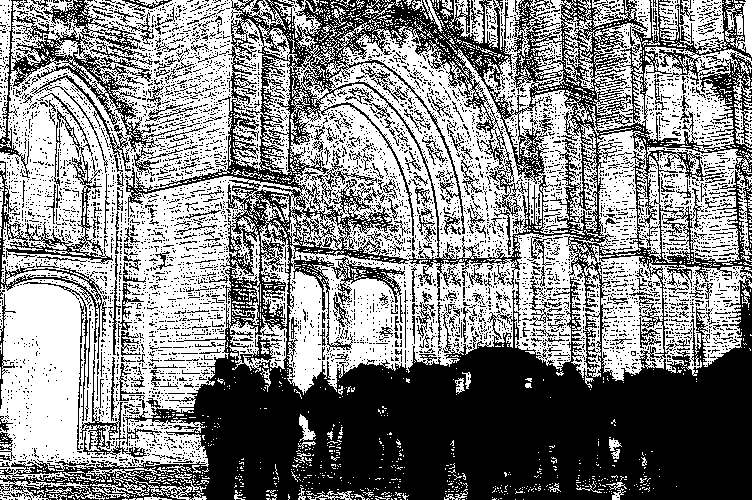

In [3]:
no_noise_map = ipu.get_no_noise_map(images)
imshow(no_noise_map*255)

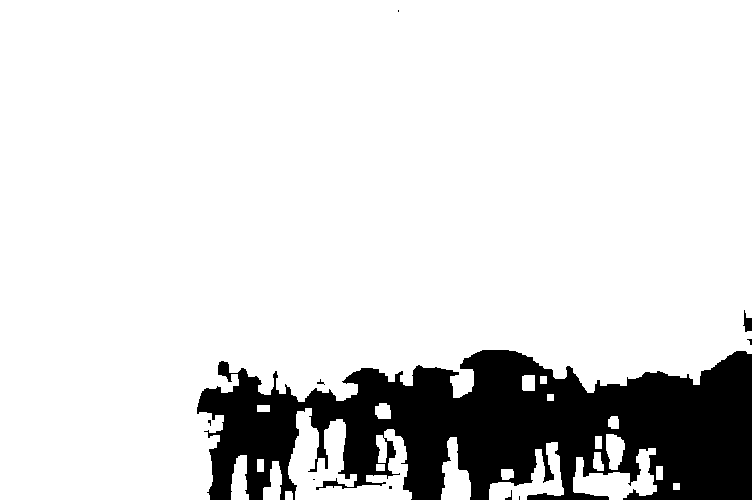

In [4]:
struct = np.ones((3,3), np.uint8)

no_noise_map_dilated = cv2.dilate(no_noise_map, struct, iterations=3)

imshow(no_noise_map_dilated*255)

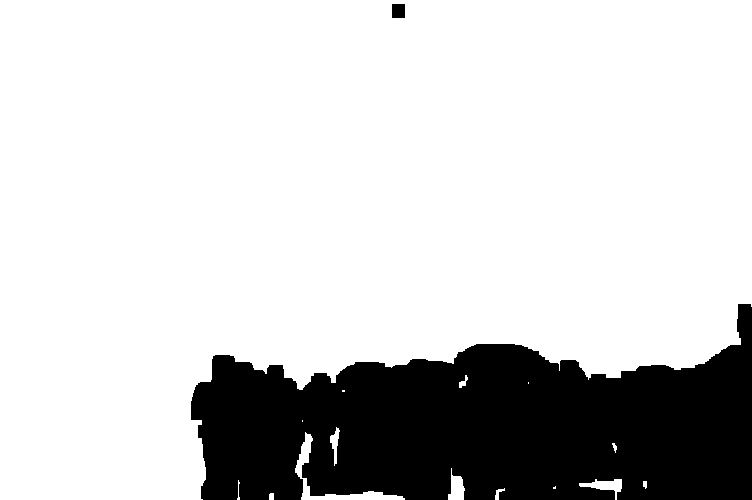

In [5]:
no_noise_map_dilated_closed = cv2.erode(no_noise_map_dilated, struct, iterations=6)
imshow(no_noise_map_dilated_closed*255)

Now, having the mask, I will iterate over each pixel, and try to assign 

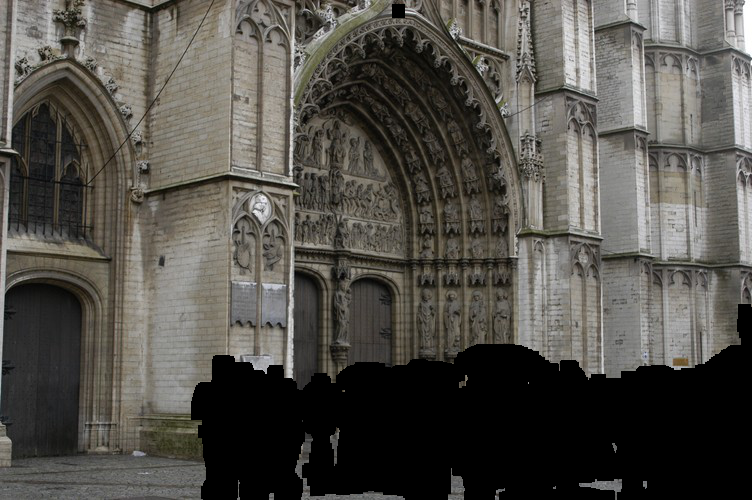

In [6]:
image_consistent= np.copy(images[1])
image_consistent[no_noise_map_dilated_closed==0] = 0
imshow(image_consistent)

In [7]:
image_consistent[-1,-1]

array([0, 0, 0], dtype=uint8)

In [8]:
def absolute_squared_RGB_diff(rgb1, rgb2):
    return np.sum((rgb1-rgb2)**2)

def get_errors(candidates, neighbours):
    errors = []
    for c in candidates:
        error=0
        for n in neighbours:
            error += absolute_squared_RGB_diff(c, n)
        errors.append(error) 
    return errors 

In [71]:
def fill_the_image(image_consistent, images, transpose=False, flip=None):


    images_stacked = np.stack(images, axis=-2) # row, column, sample, color_values
    if transpose:
        images_stacked = images_stacked.transpose((1,0,2,3))
        image_consistent_ = image_consistent.transpose((1,0,2))
    if flip is not None:
        images_stacked = np.flip(images_stacked, axis=flip)
        image_consistent_ = np.flip(image_consistent_, axis=flip)
    print(images_stacked.shape)
    img = np.copy(image_consistent_)
    img_shape = img.shape
    zero_arr = np.array([0,0,0])
    for row in range(1, img_shape[0]):  #FIXME - be prone to inconsistencies on the edges
        for col in range(1, img_shape[1]):
            if (img[row,col] == zero_arr).all():
                
                # among all the images find the pixel that results in the smallest error
                candidates = images_stacked[row,col]
                neighbours = img[row-1:row+2, col-1:col+2]
                neighbours = neighbours.reshape(neighbours.shape[0]*neighbours.shape[1],-1)
                # drop pixels that are blank
                neighbours = neighbours[np.any(neighbours!=0, axis=1)]
                # assign  the most probable candidate
                
                errors = get_errors(candidates.astype(int), neighbours.astype(int))
                img[row, col] = candidates[np.argmin(errors).astype(int)]
                
            else:
            # if value is consistent for all the images than proceed to the next pixel
                continue

    if flip is not None:
        img = np.flip(img, axis=flip)
    if transpose:
        img = img.transpose((1,0,2))
    return img

In [50]:
img_1 = fill_the_image(image_consistent, images )
img_2 = fill_the_image(image_consistent, images, flip=0)
img_3 = fill_the_image(image_consistent, images, flip=1)
img_4 = fill_the_image(image_consistent, images, flip=(0,1))

(500, 752, 5, 3)
(500, 752, 5, 3)
(500, 752, 5, 3)


In [72]:
# img_5 = fill_the_image(image_consistent, images, transpose=True)
img_6 = fill_the_image(image_consistent, images,transpose=True, flip=0)
img_7 = fill_the_image(image_consistent, images,transpose=True, flip=1)
# img_8 = fill_the_image(image_consistent, images,transpose=True, flip=(0,1))

(752, 500, 5, 3)
(752, 500, 5, 3)


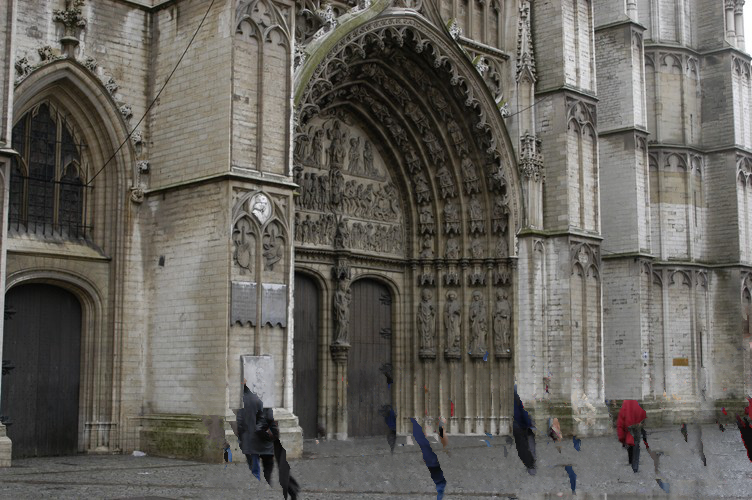

In [44]:
imshow(img_1)

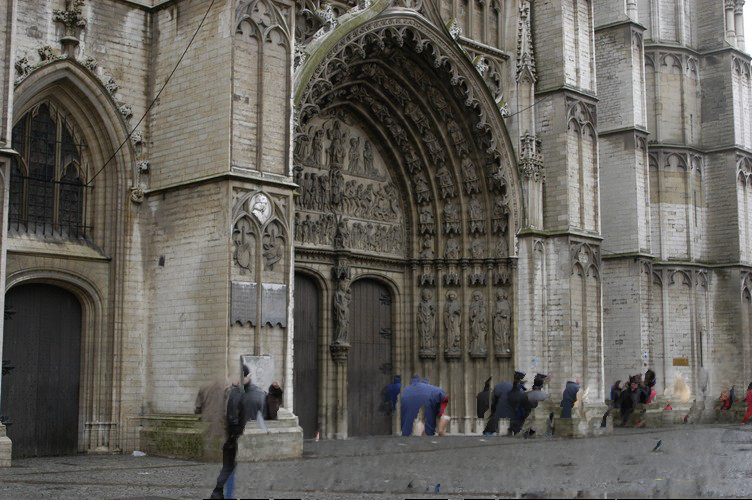

In [45]:
imshow(img_2)


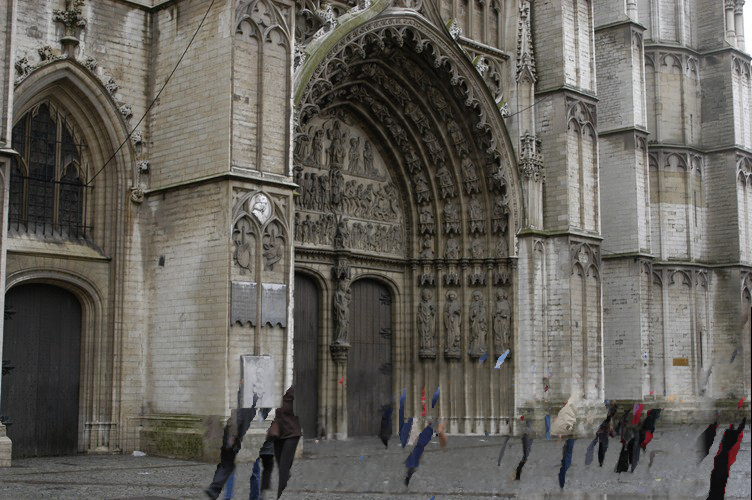

In [46]:
imshow(img_3)

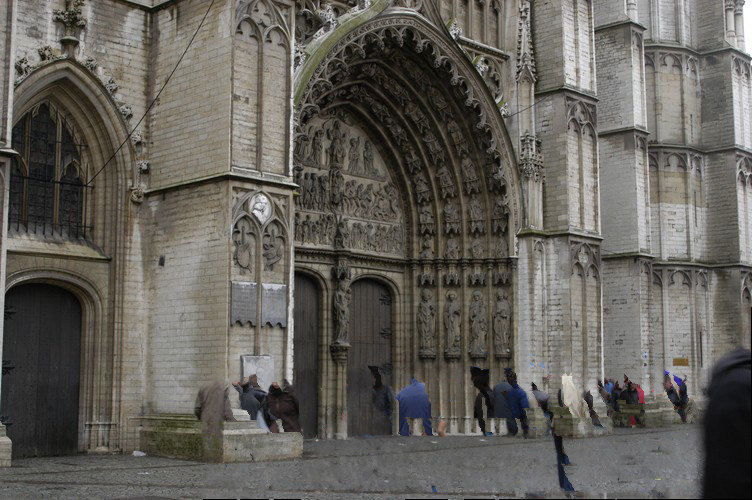

In [49]:
imshow(img_4)

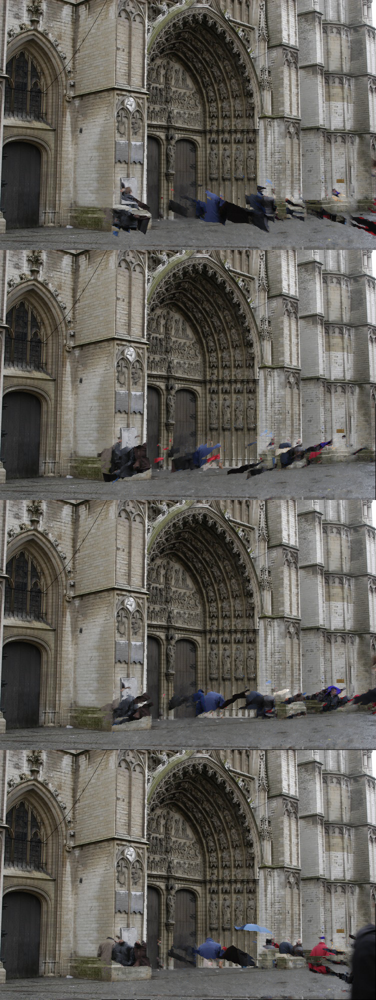

In [73]:
imshow(np.concatenate([img_5,img_6,img_7,img_8],0))

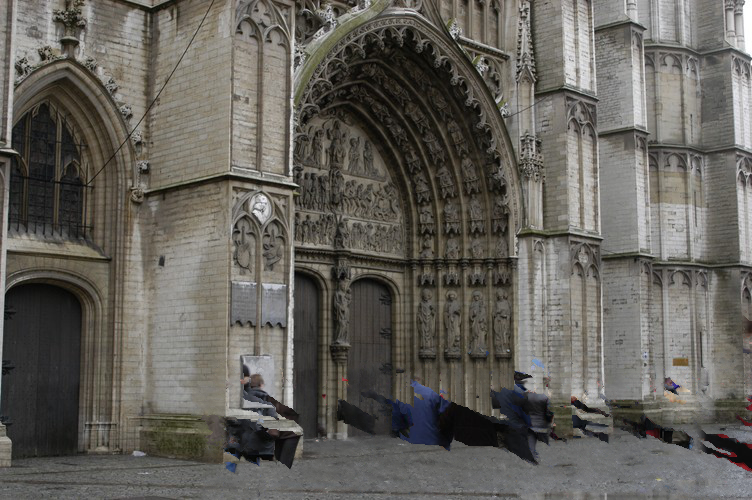

In [61]:
imshow(img_5)

In [74]:
median_img = ipu.get_median_image([img_1, img_2, img_3, img_4, img_5, img_6, img_7, img_8])

In [76]:
median_img = ipu.get_median_image([img_1, img_2, img_3, img_4])

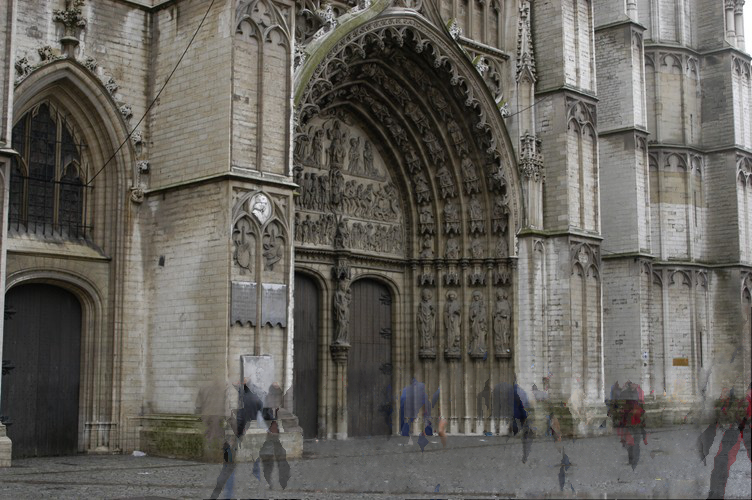

In [77]:
imshow(median_img)